# All Sites Random Forest: Unloading Paper
## Reruning the random forest model and taking a closer look at the decision trees in the ensemble

created by Cassie Lumbrazo\
date: July 2024\
previously on the linux box, python environment: **raster**, using raster for now\
now, the python environment locally: **random_forest**, which I created just for this to try and resolve some package issues to get this plotting again.\
Pray for my package issues... 


In [1]:
# import packages 
%matplotlib inline

# plotting packages 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns 

sns.set_theme()
# plt.rcParams['figure.figsize'] = [12,6] #overriding size

# data packages 
import pandas as pd
import numpy as np
import xarray as xr

import copy 
import pickle

In [2]:
import graphviz

# this is not working, going to try one more thing before I cry 

import pygraphviz
# import python-graphviz
import pydot
import pydotplus

# I installed those two, and maybe you need them now with new versions...... 

In [3]:
import os

In [4]:
# print(os.environ['path'])    

In [5]:
# os.environ["PATH"] += os.pathsep + 'C:/Users/Lumbr/miniconda3/Library/bin/graphviz/'
# os.environ["PATH"] += os.pathsep + 'C:/Users/Lumbr/miniconda3/env/randon_forest/Library/bin/graphviz/'

# I installed Graphviz directly from the website, using the exe installer, which put graph viz in my Program Files and said it added a path too...
# os.environ["PATH"] += os.pathsep + 'C:/Program Files/Graphviz/include/graphviz/'

In [6]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn import tree
from sklearn.model_selection import train_test_split
import pydotplus 
from IPython.display import Image
from sklearn.model_selection import GridSearchCV
from sklearn import ensemble
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import permutation_importance

### Load the data

In [7]:
local_path = "/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/Python/"

In [8]:
df_unload = pd.read_csv(local_path + "allsites_snowunload.csv")
df_unload.head()

,datetime,shortwave,longwave,windspeed,RH,temp,A,B,CD,E,Type,Class,Snow,Sunlit,Classification,Typesymbol,Snowsymbol,site,pressure,snowdepth
0,2016-10-06 06:00:00,4.93,297.470,1.180,96.650,-3.495,1.0,0.0,1.0,0.0,NaN,NaN,NaN,Not Sunlit,Snow Staying,128.0,128.0,niwot,NaN,NaN
1,2016-10-06 07:00:00,29.43,298.655,1.735,93.195,-3.325,1.0,0.0,1.0,0.0,NaN,NaN,NaN,Not Sunlit,Snow Staying,128.0,128.0,niwot,NaN,NaN
2,2016-10-06 08:00:00,124.50,309.965,2.080,83.190,-2.430,1.0,0.0,1.0,0.0,NaN,NaN,NaN,Not Sunlit,Snow Staying,128.0,128.0,niwot,NaN,NaN
3,2016-10-06 09:00:00,102.04,306.465,2.745,90.135,-3.250,1.0,0.0,1.0,0.0,NaN,NaN,NaN,Not Sunlit,Snow Staying,128.0,128.0,niwot,NaN,NaN
4,2016-10-06 10:00:00,614.38,240.145,4.595,80.390,-3.350,1.0,1.0,1.0,0.0,NaN,NaN,NaN,Not Sunlit,Snow Staying,128.0,128.0,niwot,NaN,NaN


In [9]:
df_unload.Classification.value_counts()

Classification
Snow Staying      1288
Snow Unloading     446
Name: count, dtype: int64

# Random Forest

### Prepare the dataset for Random Forest

In [10]:
# cannot have any nans for random forest... so let's start by deleting columns we do not need 
df_int = df_unload.copy(deep=True)
df_int = df_int.drop(columns=['datetime', 'longwave', 'RH', 'pressure', 'snowdepth']) # the major ones
df_int.head()

,shortwave,windspeed,temp,A,B,CD,E,Type,Class,Snow,Sunlit,Classification,Typesymbol,Snowsymbol,site
0,4.93,1.180,-3.495,1.0,0.0,1.0,0.0,NaN,NaN,NaN,Not Sunlit,Snow Staying,128.0,128.0,niwot
1,29.43,1.735,-3.325,1.0,0.0,1.0,0.0,NaN,NaN,NaN,Not Sunlit,Snow Staying,128.0,128.0,niwot
2,124.50,2.080,-2.430,1.0,0.0,1.0,0.0,NaN,NaN,NaN,Not Sunlit,Snow Staying,128.0,128.0,niwot
3,102.04,2.745,-3.250,1.0,0.0,1.0,0.0,NaN,NaN,NaN,Not Sunlit,Snow Staying,128.0,128.0,niwot
4,614.38,4.595,-3.350,1.0,1.0,1.0,0.0,NaN,NaN,NaN,Not Sunlit,Snow Staying,128.0,128.0,niwot


In [11]:
# also drop the ones that are not important right now 
df_int = df_int.drop(columns=['A','B','E','Type','Class','Snow', 'Sunlit', 'Typesymbol', 'Snowsymbol'])
df_int.head()

,shortwave,windspeed,temp,CD,Classification,site
0,4.93,1.180,-3.495,1.0,Snow Staying,niwot
1,29.43,1.735,-3.325,1.0,Snow Staying,niwot
2,124.50,2.080,-2.430,1.0,Snow Staying,niwot
3,102.04,2.745,-3.250,1.0,Snow Staying,niwot
4,614.38,4.595,-3.350,1.0,Snow Staying,niwot


In [12]:
# Saving this simplified dataframe for use later 
df_int_sites = (df_int.copy(deep=True)).dropna()
df_int_sites.head()

,shortwave,windspeed,temp,CD,Classification,site
0,4.93,1.180,-3.495,1.0,Snow Staying,niwot
1,29.43,1.735,-3.325,1.0,Snow Staying,niwot
2,124.50,2.080,-2.430,1.0,Snow Staying,niwot
3,102.04,2.745,-3.250,1.0,Snow Staying,niwot
4,614.38,4.595,-3.350,1.0,Snow Staying,niwot


In [13]:
len(df_int_sites)

1650

In [14]:
df_int = df_int.drop(columns=['Classification', 'site'])
df_int.head()

,shortwave,windspeed,temp,CD
0,4.93,1.180,-3.495,1.0
1,29.43,1.735,-3.325,1.0
2,124.50,2.080,-2.430,1.0
3,102.04,2.745,-3.250,1.0
4,614.38,4.595,-3.350,1.0


In [15]:
# now, drop na from the very simple dataframe
df_int = df_int.dropna()
len(df_int)

1650

In [16]:
df_int['CD'] =        df_int['CD'].astype(int)
df_int['temp'] =      df_int['temp'].astype(int)
df_int['shortwave'] = df_int['shortwave'].astype(int)
df_int['windspeed'] = df_int['windspeed'].astype(int)

df_int.head()

,shortwave,windspeed,temp,CD
0,4,1,-3,1
1,29,1,-3,1
2,124,2,-2,1
3,102,2,-3,1
4,614,4,-3,1


In [17]:
# Finally, we can start the random forest analysis 
# first, we need to split the data into training and testing sets

# create the x, variables, columns
X = df_int.drop(columns=['CD'])
X.head()

,shortwave,windspeed,temp
0,4,1,-3
1,29,1,-3
2,124,2,-2
3,102,2,-3
4,614,4,-3


In [18]:
# create the y, predictor, column
y = df_int.CD
y.head()

0    1
1    1
2    1
3    1
4    1
Name: CD, dtype: int32

In [19]:
# x.describe()
X.isnull().values.any()
y.isnull().values.any()

False

## Start with a Single Decision Tree 
to test that our dataset is setup properly

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

clf = tree.DecisionTreeClassifier(criterion='gini', max_depth=3)
clf = clf.fit(X_train, y_train)

y_pred_train = clf.predict(X_train)
print('Accuracy on train data is %.2f' % (accuracy_score(y_train, y_pred_train)))

y_pred_test = clf.predict(X_test)
print('Accuracy on test data is %.2f' % (accuracy_score(y_test, y_pred_test)))

dot_data = tree.export_graphviz(clf, feature_names=X.columns, filled=True, 
                                out_file=None) 
# graph = pydotplus.graph_from_dot_data(dot_data) 
# Image(graph.create_png())

Accuracy on train data is 0.82
Accuracy on test data is 0.84


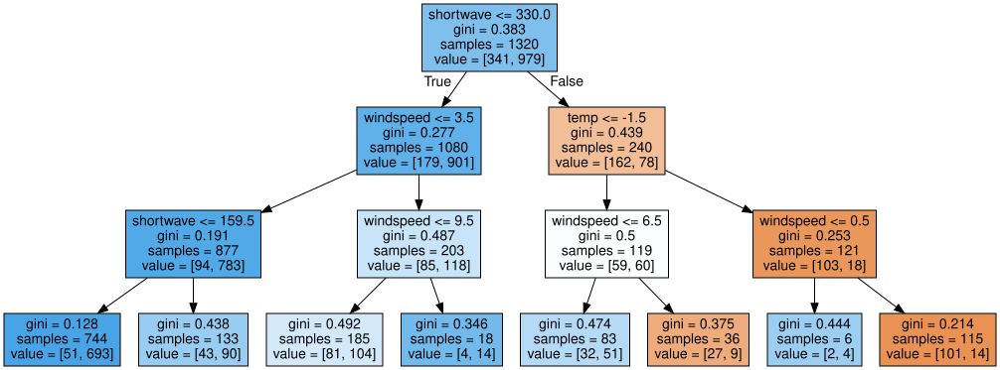

In [21]:
graph = graphviz.Source(dot_data)
graph

## Now, Random Forest

In [22]:
number_model_runs = 500 # for all random forest runs 

In [23]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.2, random_state=0)

parameters = {'n_estimators': [number_model_runs], 'max_depth':[3]} 
clf1 = GridSearchCV(ensemble.RandomForestClassifier(n_jobs=15), parameters) 

# trying to write it like this to get the n_jobs parameter to work 
# clf1  = ensemble.RandomForestClassifier(n_estimators=30, max_depth=3, n_jobs=4)

clf1.fit(X=X_train1,y=y_train1.values.ravel())
tree_model1 = clf1.best_estimator_ # only the GridSearchCV has the object "best_estimator_"

y_pred_train1 = tree_model1.predict(X_train1)
y_pred_test1 = tree_model1.predict(X_test1)
print('Accuracy on training data is %.2f' % (accuracy_score(y_train1, y_pred_train1)))
print('Accuracy on test data is %.2f' % (accuracy_score(y_test1, y_pred_test1)))
print(clf1.best_params_)

Accuracy on training data is 0.83
Accuracy on test data is 0.85
{'max_depth': 3, 'n_estimators': 500}


In [24]:
estimatorAccuracy=[]
for curEstimator in range(number_model_runs):
    estimatorAccuracy.append([curEstimator,accuracy_score(y.values, tree_model1.estimators_[curEstimator].predict(X.values))])

estimatorAccuracy=pd.DataFrame(estimatorAccuracy,columns=['estimatorNumber','Accuracy'])
estimatorAccuracy.sort_values(inplace=True,by='Accuracy',ascending=False)

bestDecisionTree1= tree_model1.estimators_[estimatorAccuracy.head(1)['estimatorNumber'].values[0]]

### And, take a look at the first decision tree

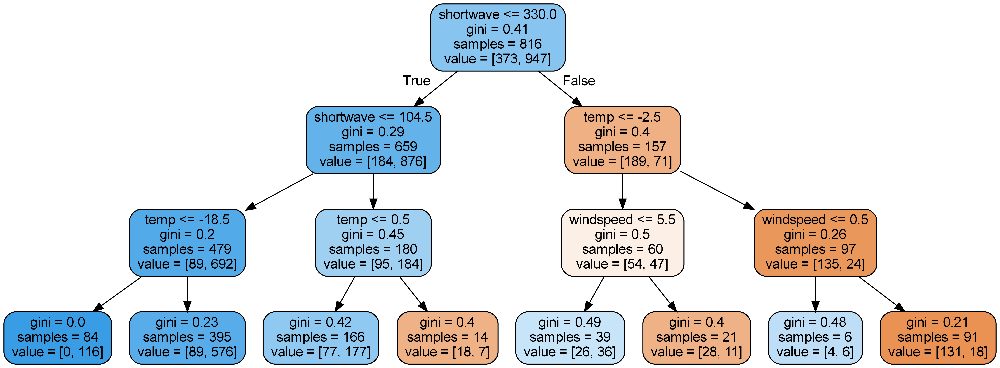

In [25]:
tree.export_graphviz(bestDecisionTree1, out_file='ensemble_tree1.dot', 
                feature_names = X.columns,
                # class_names = ('no_veg', 'veg'),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'ensemble_tree1.dot', '-o', 'ensemble_tree1.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'ensemble_tree1.png')

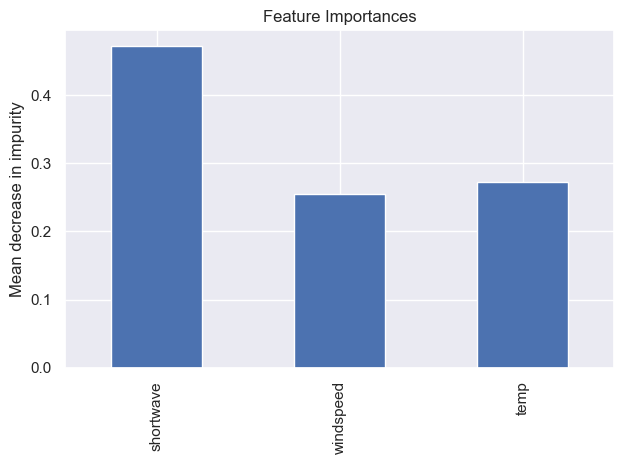

In [26]:
# Feature Importance 
importances1 = tree_model1.feature_importances_
std1 = np.std([tree_model1.feature_importances_ for tree in tree_model1.estimators_], axis=0)

forest_importances1 = pd.Series(importances1, index=X_test.columns)

fig, ax = plt.subplots()
forest_importances1.plot.bar(yerr=std1, ax=ax)
ax.set_title("Feature Importances")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [27]:
# shortwave .45, windspeed .27, temperature .31

In [28]:
# tree_model1.predict([[200,0,-10]])

## Visualize the decision trees and accuracy scores

In [29]:
estimatorAccuracy

,estimatorNumber,Accuracy
288,288,0.835152
111,111,0.832727
20,20,0.830909
363,363,0.830303
153,153,0.829091
...,...,...
433,433,0.765455
68,68,0.764848
231,231,0.763030
400,400,0.755758


### Plot the Accuracy of the Decision Trees to see how many perform well... 

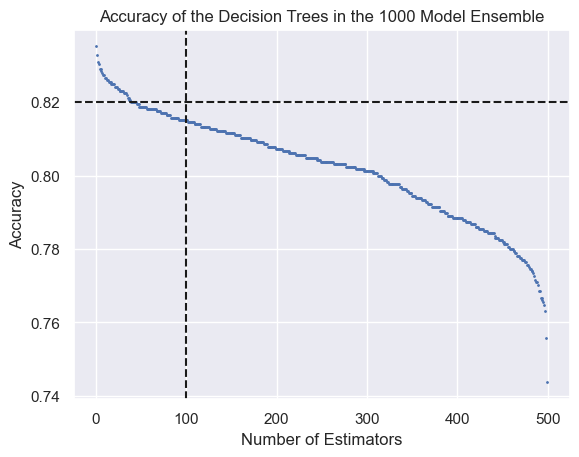

In [30]:
# make a plot of the estimator accuracy in order of highest accuracy 
plt.plot(estimatorAccuracy['Accuracy'].sort_values(ascending=False).values, marker='o', linestyle='None', markersize=1)
plt.title('Accuracy of the Decision Trees in the 1000 Model Ensemble')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')

# plot a verticle line at 100
plt.axvline(x=100, color='k', linestyle='--')
plt.axhline(y=0.82, color='k', linestyle='--')


(0.82, 0.835)

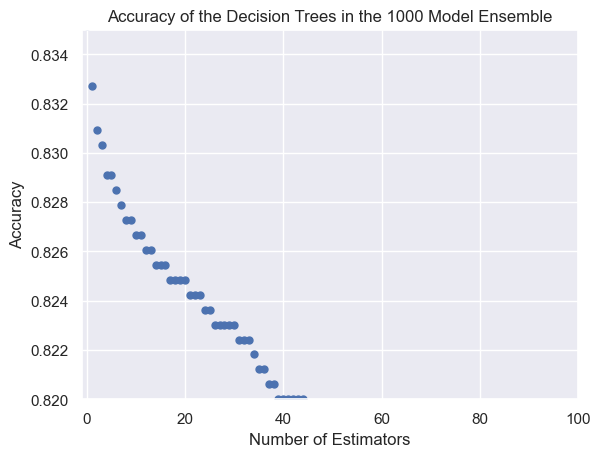

In [31]:
# make a plot of the estimator accuracy in order of highest accuracy 
plt.plot(estimatorAccuracy['Accuracy'].sort_values(ascending=False).values, marker='o', linestyle='None', markersize=5)
plt.title('Accuracy of the Decision Trees in the 1000 Model Ensemble')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')

# zoom into the xaxis 
plt.xlim(-1, 100)
plt.ylim(0.82, 0.835)

(0.83, 0.835)

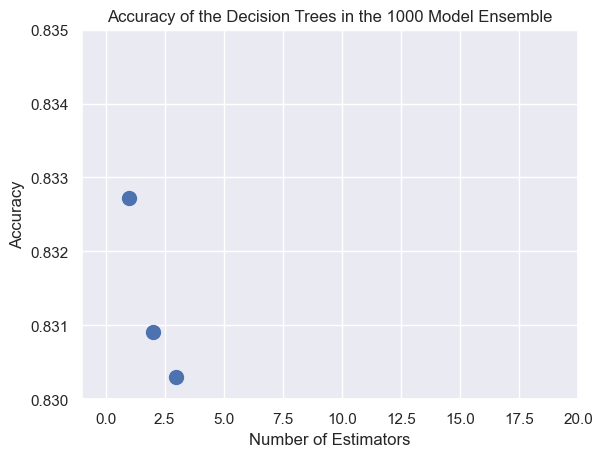

In [32]:
# make a plot of the estimator accuracy in order of highest accuracy 
plt.plot(estimatorAccuracy['Accuracy'].sort_values(ascending=False).values, marker='o', linestyle='None', markersize=10)
plt.title('Accuracy of the Decision Trees in the 1000 Model Ensemble')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')

# zoom into the xaxis 
plt.xlim(-1, 20)
plt.ylim(0.830, 0.835)

In [33]:
estimatorAccuracy.head()

,estimatorNumber,Accuracy
288,288,0.835152
111,111,0.832727
20,20,0.830909
363,363,0.830303
153,153,0.829091


In [34]:
estimatorAccuracy['estimatorNumber'].values[0]
# estimatorAccuracy['estimatorNumber'].values[1]

288

In [35]:
estimatorAccuracy['Accuracy'].values[9]

0.8272727272727273

In [36]:
tree_model1.estimators_[estimatorAccuracy['estimatorNumber'].values[0]]

DecisionTreeClassifier(max_depth=3, max_features='sqrt', random_state=759698431)

In [37]:
# bestDecisionTree1= tree_model1.estimators_[463] #first best
# bestDecisionTree2= tree_model1.estimators_[772] 

# bestDecisionTree1= tree_model1.estimators_[estimatorAccuracy['estimatorNumber'].values[0]]
bestDecisionTree2= tree_model1.estimators_[estimatorAccuracy['estimatorNumber'].values[1]]
bestDecisionTree3= tree_model1.estimators_[estimatorAccuracy['estimatorNumber'].values[2]]
bestDecisionTree4= tree_model1.estimators_[estimatorAccuracy['estimatorNumber'].values[3]]
bestDecisionTree5= tree_model1.estimators_[estimatorAccuracy['estimatorNumber'].values[4]]
bestDecisionTree6= tree_model1.estimators_[estimatorAccuracy['estimatorNumber'].values[5]]
bestDecisionTree7= tree_model1.estimators_[estimatorAccuracy['estimatorNumber'].values[6]]
bestDecisionTree8= tree_model1.estimators_[estimatorAccuracy['estimatorNumber'].values[7]]
bestDecisionTree9= tree_model1.estimators_[estimatorAccuracy['estimatorNumber'].values[8]]
bestDecisionTree10= tree_model1.estimators_[estimatorAccuracy['estimatorNumber'].values[9]]

### Decision Tree 2

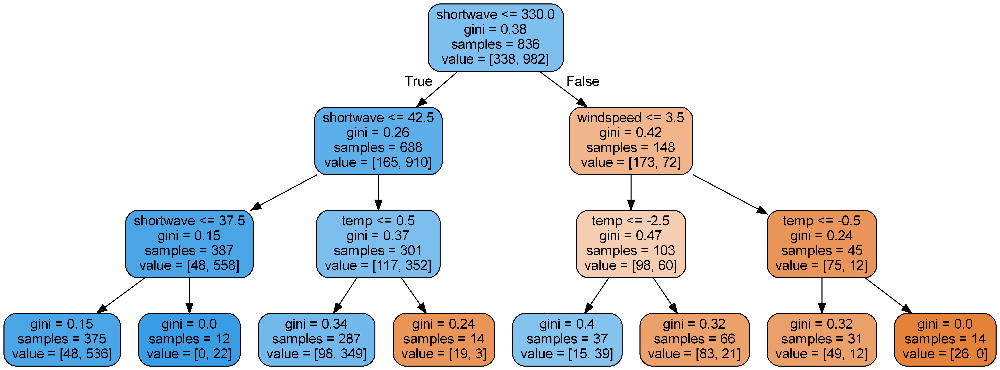

In [38]:
tree.export_graphviz(bestDecisionTree2, out_file='ensemble_tree2.dot', 
                feature_names = X.columns,
                # class_names = ('no_veg', 'veg'),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'ensemble_tree2.dot', '-o', 'ensemble_tree2.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'ensemble_tree2.png')

Third best decision tree

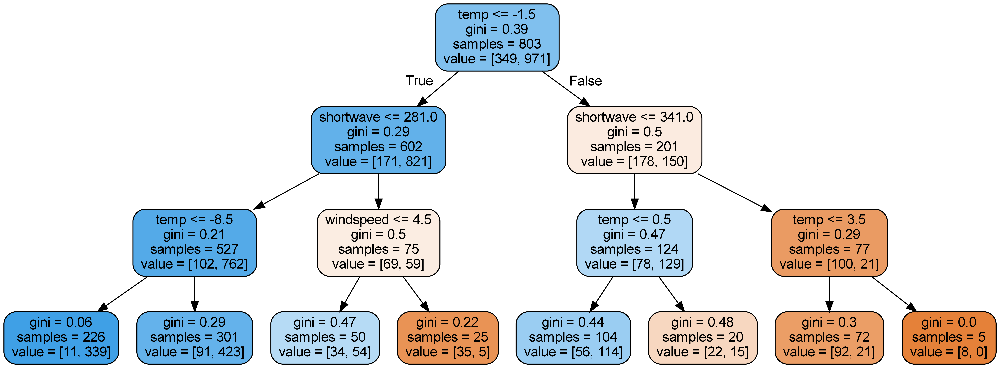

In [39]:
tree.export_graphviz(bestDecisionTree3, out_file='ensemble_tree3.dot', 
                feature_names = X.columns,
                # class_names = ('no_veg', 'veg'),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'ensemble_tree3.dot', '-o', 'ensemble_tree3.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'ensemble_tree3.png')

### Decision Tree 4

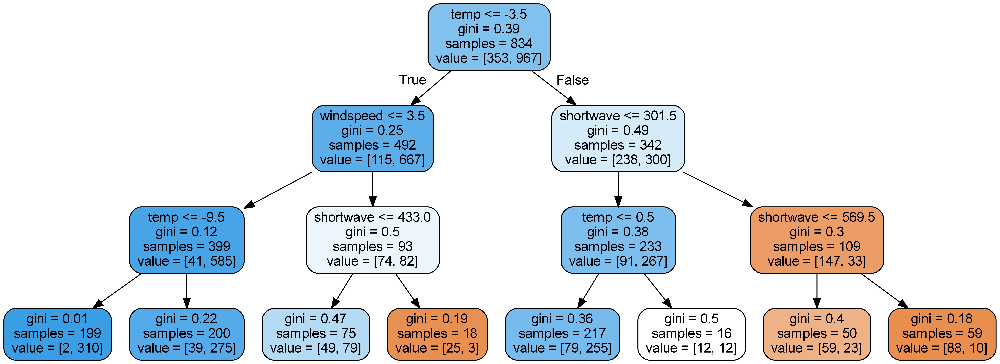

In [40]:
tree.export_graphviz(bestDecisionTree4, out_file='ensemble_tree4.dot', 
                feature_names = X.columns,
                # class_names = ('no_veg', 'veg'),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'ensemble_tree4.dot', '-o', 'ensemble_tree4.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'ensemble_tree4.png')

### Decision Tree 5

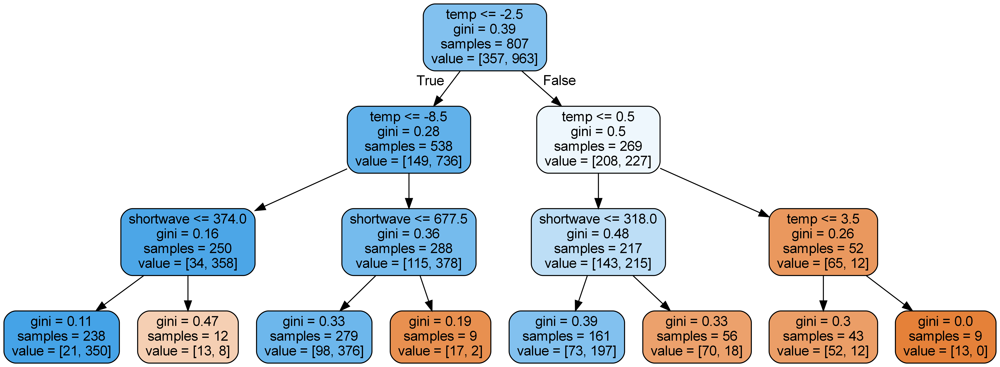

In [41]:
tree.export_graphviz(bestDecisionTree5, out_file='ensemble_tree5.dot', 
                feature_names = X.columns,
                # class_names = ('no_veg', 'veg'),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'ensemble_tree5.dot', '-o', 'ensemble_tree5.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'ensemble_tree5.png')

### Decision Tree 6

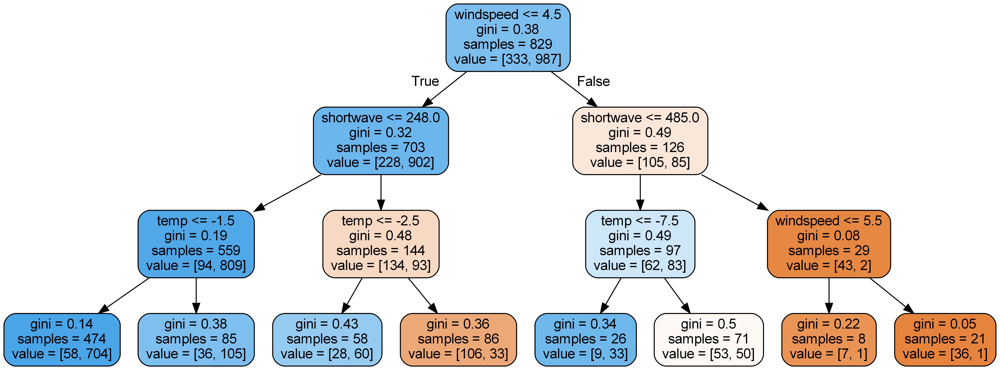

In [42]:
tree.export_graphviz(bestDecisionTree6, out_file='ensemble_tree6.dot', 
                feature_names = X.columns,
                # class_names = ('no_veg', 'veg'),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'ensemble_tree6.dot', '-o', 'ensemble_tree6.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'ensemble_tree6.png')

### Decision Tree 7

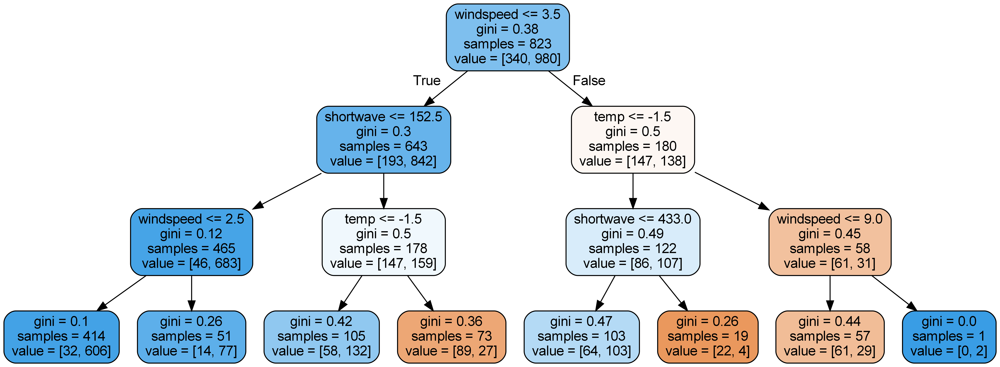

In [43]:
tree.export_graphviz(bestDecisionTree7, out_file='ensemble_tree7.dot', 
                feature_names = X.columns,
                # class_names = ('no_veg', 'veg'),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'ensemble_tree7.dot', '-o', 'ensemble_tree7.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'ensemble_tree7.png')

### Decision Tree 8

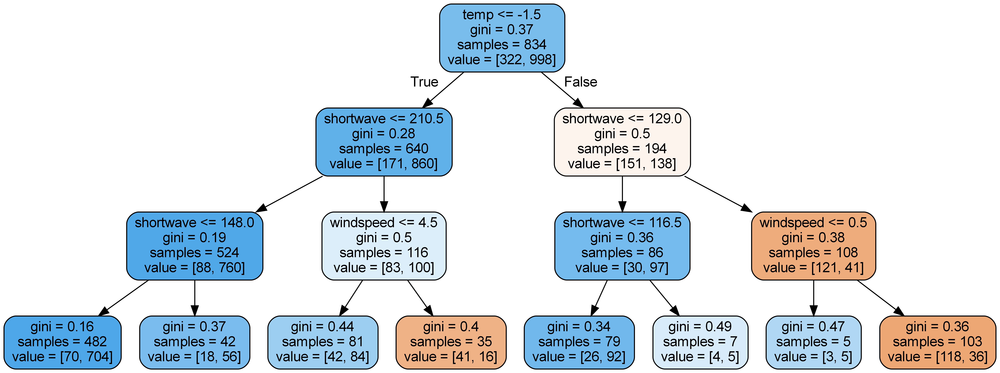

In [44]:
tree.export_graphviz(bestDecisionTree8, out_file='ensemble_tree8.dot', 
                feature_names = X.columns,
                # class_names = ('no_veg', 'veg'),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'ensemble_tree8.dot', '-o', 'ensemble_tree8.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'ensemble_tree8.png')

### Decision Tree 9

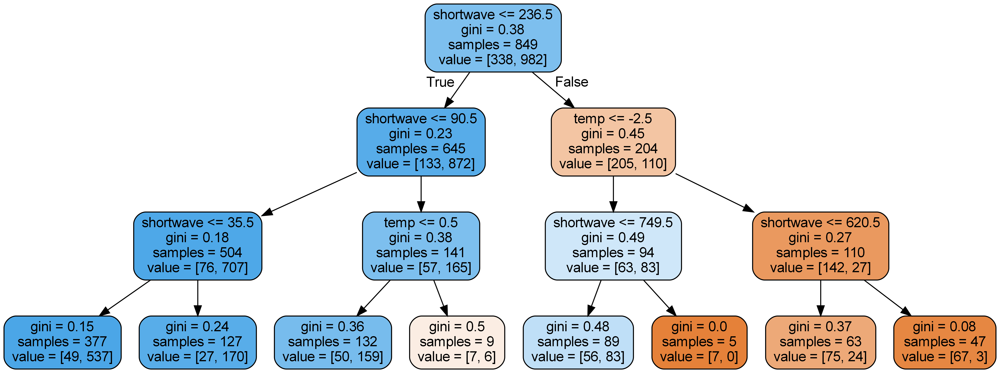

In [45]:
tree.export_graphviz(bestDecisionTree9, out_file='ensemble_tree9.dot', 
                feature_names = X.columns,
                # class_names = ('no_veg', 'veg'),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'ensemble_tree9.dot', '-o', 'ensemble_tree9.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'ensemble_tree9.png')

### Decision Tree 10

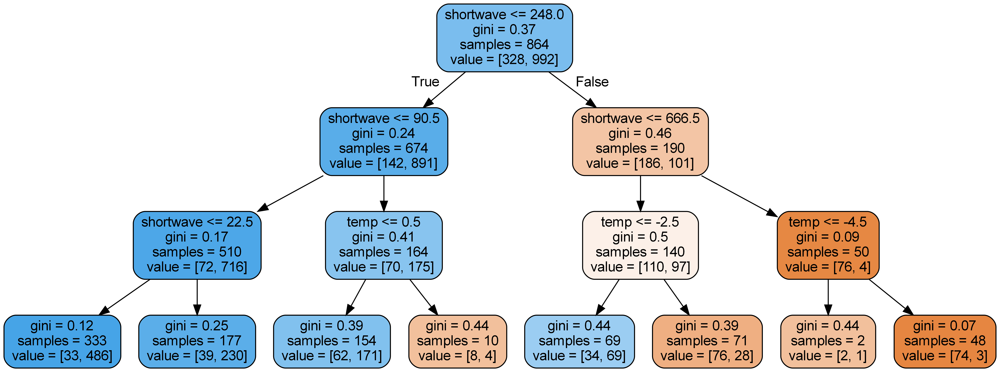

In [46]:
tree.export_graphviz(bestDecisionTree10, out_file='ensemble_tree10.dot', 
                feature_names = X.columns,
                # class_names = ('no_veg', 'veg'),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'ensemble_tree10.dot', '-o', 'ensemble_tree10.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'ensemble_tree10.png')

# Model Prediction Results

In [47]:
df_int_copy = df_int.copy(deep=True)
df_int_copy['model'] = np.nan
df_int_copy.head()

,shortwave,windspeed,temp,CD,model
0,4,1,-3,1,NaN
1,29,1,-3,1,NaN
2,124,2,-2,1,NaN
3,102,2,-3,1,NaN
4,614,4,-3,1,NaN


In [48]:
print(len(df_int_copy))
print(len(df_int_sites))
print(len(X))

# so the length is not the issue, but since we dropped the na's, the index is not the same

1650
1650
1650


In [49]:
df_int_copy.reset_index(inplace=True)
df_int_sites.reset_index(inplace=True)
X.reset_index(inplace=True)

In [50]:
df_int_sites.drop(columns=['index'], inplace=True)

In [51]:
df_int_copy.drop(columns=['index'], inplace=True)
X.drop(columns=['index'], inplace=True)

In [52]:
## incase we rerun the above reset index twice my accident, another column named level_0 is created, so run this if we need
# df_int_copy.drop(columns=['level_0'], inplace=True)

In [53]:
# instead of test dataset, run the model on the full dataframe and save the result to a column in a new dataframe
# y_pred_test1 = tree_model1.predict(X_test1)
df_int_copy['model'] = pd.Series(tree_model1.predict(X))
df_int_copy

,shortwave,windspeed,temp,CD,model
0,4,1,-3,1,1
1,29,1,-3,1,1
2,124,2,-2,1,1
3,102,2,-3,1,1
4,614,4,-3,1,0
...,...,...,...,...,...
1645,400,0,2,1,0
1646,605,0,3,1,0
1647,854,1,4,0,0
1648,902,1,4,0,0


### Now, try plotting to see if this worked

In [54]:
sns.set_theme()
# plt.rcParams['figure.figsize'] = [12,6] #overriding size

# interactive plotting
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots # adding for subplots
import plotly.figure_factory as ff

In [55]:
nameallsitesA = 'A)  All Sites Together'
namesodankylaB = 'B)  Sodankylä, Finland'
namelaretC = 'C)  Davos Laret, Switzerland'
nameniwotD = 'D)  Niwot Ridge, Colorado, USA'

nametemperature = "air temperature (℃)"
namewindspeed = "wind speed (ms⁻¹)"
nameshortwave = "shortwave radiation (Wm⁻²)"

In [56]:
# define data 
threshold_line_color = 'grey'
# threshold_line_color = 'darkslategrey'
threshold_line_opacity = .2

# set plot constants 
group_labels = ['obs snow staying', 'obs snow unloading', 'model snow staying', 'model snow unloading']

# trying different colors for snow in the canopy for these plots only... we will see if it helps
colorsnow = '#7dcfd4' # slightly desaturated cyan
colorsnowunload = '#1F15D5' # bright, deep blue 
colorsnow2 = '#2acfd4' # a bit brighter cyan than colorsnow, we will try to see if this looks better on the plots
# unloadcolors = [colorsnow, colorsnowunload]
# colors = [colorsnow2, colorsnowunload, colorsnow2, colorsnowunload] # my colors 
colors = [colorsnow2, colorsnowunload, 'grey', 'black'] # my colors 

bintemp = 1
binwind = 1
binSW = 20

model_snowstay = df_int_copy.where(df_int_copy.model == 1) # 1 staying
model_snowunload = df_int_copy.where(df_int_copy.model == 0) # 0 unloading

df_snowstay = df_int_copy.where(df_int_copy.CD == 1) # 1 staying
df_snowunload = df_int_copy.where(df_int_copy.CD == 0) # 0 unloading

fig = make_subplots(rows=1, cols=3, shared_yaxes='columns', shared_xaxes='columns', 
                    # subplot_titles=("", nameallsitesA, "", "", namesodankylaB, "", "", namelaretC, "", "", nameniwotD), # centered
                    # subplot_titles=(namesod,"", "", namelaret, "", "", nameniwot, "", ""), # on the first one
                    horizontal_spacing = 0.04, vertical_spacing = 0.04)

# ROW ZERO NOW ADDING IT_____________________________________________________________________________________________________
# temp temperature 
x1 = df_snowstay.temp.dropna(how='all') 
x2 = df_snowunload.temp.dropna(how='all')

x3 = model_snowstay.temp.dropna(how='all') 
x4 = model_snowunload.temp.dropna(how='all') 

hist_data = [x1, x2, x3, x4]

fig1 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig1.select_traces():
    fig.add_trace(trace, row=1, col=1)
    fig.add_vline(x=-2.5, line_color=threshold_line_color, row=1, col=1, opacity=threshold_line_opacity)
    fig.add_vline(x=1.5, line_color=threshold_line_color, row=1, col=1, opacity=threshold_line_opacity)
    fig.add_vline(x=0.5, line_color=threshold_line_color, row=1, col=1, opacity=threshold_line_opacity)

# sod shortwave 
x1 = df_snowstay.shortwave.dropna(how='all') 
x2 = df_snowunload.shortwave.dropna(how='all')

x3 = model_snowstay.shortwave.dropna(how='all') 
x4 = model_snowunload.shortwave.dropna(how='all') 

hist_data = [x1, x2, x3, x4]

fig2 = ff.create_distplot(hist_data, group_labels, bin_size=binSW, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig2.select_traces():
    fig.add_trace(trace, row=1, col=2)
    fig.add_vline(x=258, line_color=threshold_line_color, row=1, col=2, opacity=threshold_line_opacity)
    fig.add_vline(x=57.5, line_color=threshold_line_color, row=1, col=2, opacity=threshold_line_opacity)


# sod windspeed 
x1 = df_snowstay.windspeed.dropna(how='all') 
x2 = df_snowunload.windspeed.dropna(how='all')

x3 = model_snowstay.windspeed.dropna(how='all') 
x4 = model_snowunload.windspeed.dropna(how='all') 

hist_data = [x1, x2, x3, x4]

fig2 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig2.select_traces():
    fig.add_trace(trace, row=1, col=3)
    fig.add_vline(x=3.5, line_color=threshold_line_color, row=1, col=3, opacity=threshold_line_opacity)
    fig.add_vline(x=5.5, line_color=threshold_line_color, row=1, col=3, opacity=threshold_line_opacity)

# # FIRST ROW_____________________________________________________________________________________________________
# # sod temperature 
# x1 = sod_df_snowstay.temp.dropna(how='all') 
# x2 = sod_df_snowunload.temp.dropna(how='all') 
# hist_data = [x1, x2]

# fig1 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
#                              show_hist=False, show_rug=False, curve_type='normal')


# for trace in fig1.select_traces():
#     fig.add_trace(trace, row=2, col=1)
#     fig.add_vline(x=-2.5, line_color=threshold_line_color, row=2, col=1, opacity=threshold_line_opacity)
#     fig.add_vline(x=1.5, line_color=threshold_line_color, row=2, col=1, opacity=threshold_line_opacity)
#     fig.add_vline(x=0.5, line_color=threshold_line_color, row=2, col=1, opacity=threshold_line_opacity)


# # sod shortwave 
# x1 = sod_df_snowstay.shortwave.dropna(how='all') 
# x2 = sod_df_snowunload.shortwave.dropna(how='all') 
# hist_data = [x1, x2]

# fig2 = ff.create_distplot(hist_data, group_labels, bin_size=binSW, colors=colors, 
#                              show_hist=False, show_rug=False, curve_type='normal')


# for trace in fig2.select_traces():
#     fig.add_trace(trace, row=2, col=2)
#     fig.add_vline(x=258, line_color=threshold_line_color, row=2, col=2, opacity=threshold_line_opacity)
#     fig.add_vline(x=57.5, line_color=threshold_line_color, row=2, col=2, opacity=threshold_line_opacity)


# # sod windspeed 
# x1 = sod_df_snowstay.windspeed.dropna(how='all') 
# x2 = sod_df_snowunload.windspeed.dropna(how='all') 
# hist_data = [x1, x2]

# fig2 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
#                              show_hist=False, show_rug=False, curve_type='normal')


# for trace in fig2.select_traces():
#     fig.add_trace(trace, row=2, col=3)
#     fig.add_vline(x=3.5, line_color=threshold_line_color, row=2, col=3, opacity=threshold_line_opacity)
#     fig.add_vline(x=5.5, line_color=threshold_line_color, row=2, col=3, opacity=threshold_line_opacity)


# # SECOND ROW_____________________________________________________________________________________________________
# # laret temperature 
# x1 = laret_df_snowstay.temp.dropna(how='all') 
# x2 = laret_df_snowunload.temp.dropna(how='all') 
# hist_data = [x1, x2]

# fig1 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
#                              show_hist=False, show_rug=False, curve_type='normal')


# for trace in fig1.select_traces():
#     fig.add_trace(trace, row=3, col=1)
#     fig.add_vline(x=-2.5, line_color=threshold_line_color, row=3, col=1, opacity=threshold_line_opacity)
#     fig.add_vline(x=1.5, line_color=threshold_line_color, row=3, col=1, opacity=threshold_line_opacity)
#     fig.add_vline(x=0.5, line_color=threshold_line_color, row=3, col=1, opacity=threshold_line_opacity)

# # laret shortwave 
# x1 = laret_df_snowstay.shortwave.dropna(how='all') 
# x2 = laret_df_snowunload.shortwave.dropna(how='all') 
# hist_data = [x1, x2]

# fig2 = ff.create_distplot(hist_data, group_labels, bin_size=binSW, colors=colors, 
#                              show_hist=False, show_rug=False, curve_type='normal')


# for trace in fig2.select_traces():
#     fig.add_trace(trace, row=3, col=2)
#     fig.add_vline(x=258, line_color=threshold_line_color, row=3, col=2, opacity=threshold_line_opacity)
#     fig.add_vline(x=57.5, line_color=threshold_line_color, row=3, col=2, opacity=threshold_line_opacity)


# # laret windspeed 
# x1 = laret_df_snowstay.windspeed.dropna(how='all') 
# x2 = laret_df_snowunload.windspeed.dropna(how='all') 
# hist_data = [x1, x2]

# fig2 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
#                              show_hist=False, show_rug=False, curve_type='normal')


# for trace in fig2.select_traces():
#     fig.add_trace(trace, row=3, col=3)
#     fig.add_vline(x=3.5, line_color=threshold_line_color, row=3, col=3, opacity=threshold_line_opacity)
#     fig.add_vline(x=5.5, line_color=threshold_line_color, row=3, col=3, opacity=threshold_line_opacity)

# # THIRD ROW_____________________________________________________________________________________________________
# # niwot temperature 
# x1 = niwot_df_snowstay.temp.dropna(how='all') 
# x2 = niwot_df_snowunload.temp.dropna(how='all') 
# hist_data = [x1, x2]

# fig1 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
#                              show_hist=False, show_rug=False, curve_type='normal')


# for trace in fig1.select_traces():
#     fig.add_trace(trace, row=4, col=1)
#     fig.add_vline(x=-2.5, line_color=threshold_line_color, row=4, col=1, opacity=threshold_line_opacity)
#     fig.add_vline(x=1.5, line_color=threshold_line_color, row=4, col=1, opacity=threshold_line_opacity)
#     fig.add_vline(x=0.5, line_color=threshold_line_color, row=4, col=1, opacity=threshold_line_opacity)
    

# # niwot shortwave 
# x1 = niwot_df_snowstay.shortwave.dropna(how='all') 
# x2 = niwot_df_snowunload.shortwave.dropna(how='all') 
# hist_data = [x1, x2]

# fig2 = ff.create_distplot(hist_data, group_labels, bin_size=binSW, colors=colors, 
#                              show_hist=False, show_rug=False, curve_type='normal')


# for trace in fig2.select_traces():
#     fig.add_trace(trace, row=4, col=2)
#     fig.add_vline(x=258, line_color=threshold_line_color, row=4, col=2, opacity=threshold_line_opacity)
#     fig.add_vline(x=57.5, line_color=threshold_line_color, row=4, col=2, opacity=threshold_line_opacity)


# # niwot windspeed 
# x1 = niwot_df_snowstay.windspeed.dropna(how='all') 
# x2 = niwot_df_snowunload.windspeed.dropna(how='all') 
# hist_data = [x1, x2]

# fig2 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors,
#                              show_hist=False, show_rug=False, curve_type='normal')


# for trace in fig2.select_traces():
#     fig.add_trace(trace, row=4, col=3)
#     # fig.add_vline(x=np.mean(x1), line_color=colorsnow, line_dash='dash', row=4, col=3) # the code if we want to plot the mean PDF lines
#     # fig.add_vline(x=np.mean(x2), line_color=colorsnowunload, line_dash='dash', row=4, col=3)
#     fig.add_vline(x=3.5, line_color=threshold_line_color, row=4, col=3, opacity=threshold_line_opacity)
#     fig.add_vline(x=5.5, line_color=threshold_line_color, row=4, col=3, opacity=threshold_line_opacity)
#     # fig.add_trace(trace, row=4, col=3) # was trying to put this here to reorder.., but it did not do anything 



# update legends layouts and labels 
fig.update_layout(title='Observations vs. Random Forest Model for all data', width=1200, height=400, showlegend=True)

fig.update_yaxes(title_text='probability density', row=1, col=1) # consider trying to make this a text on the side of the page instead to center it

fig.update_xaxes(title_text=nametemperature, row=4, col=1)
fig.update_xaxes(title_text=nameshortwave, row=4, col=2)
fig.update_xaxes(title_text=namewindspeed, row=4, col=3)

# fig.add_annotation(x=2, y=.1, text='texting', )

fig.show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

# Trying putting it all together for the sites 

In [ ]:
df_int_sites['model'] = df_int_copy['model'].copy(deep=True)
df_int_sites

,shortwave,windspeed,temp,CD,Classification,site,model
0,4.930000,1.180000,-3.495000,1.0,Snow Staying,niwot,1
1,29.430000,1.735000,-3.325000,1.0,Snow Staying,niwot,1
2,124.500000,2.080000,-2.430000,1.0,Snow Staying,niwot,1
3,102.040000,2.745000,-3.250000,1.0,Snow Staying,niwot,1
4,614.380000,4.595000,-3.350000,1.0,Snow Staying,niwot,0
...,...,...,...,...,...,...,...
1645,400.306250,0.770125,2.143021,1.0,Snow Staying,laret,0
1646,605.846250,0.973554,3.865325,1.0,Snow Staying,laret,0
1647,854.292500,1.648042,4.049008,0.0,Snow Unloading,laret,0
1648,902.823333,1.427383,4.768171,0.0,Snow Unloading,laret,0


Might want to be careful with this and come back, because the model for laret is NAN? strange

In [ ]:
# define data 
threshold_line_color = 'grey'
# threshold_line_color = 'darkslategrey'
threshold_line_opacity = .2

# set plot constants 
group_labels = ['obs snow staying', 'obs snow unloading', 'model snow staying', 'model snow unloading']

# trying different colors for snow in the canopy for these plots only... we will see if it helps
colorsnow = '#7dcfd4' # slightly desaturated cyan
colorsnowunload = '#1F15D5' # bright, deep blue 
colorsnow2 = '#2acfd4' # a bit brighter cyan than colorsnow, we will try to see if this looks better on the plots
# unloadcolors = [colorsnow, colorsnowunload]
# colors = [colorsnow2, colorsnowunload, colorsnow2, colorsnowunload] # my colors 
colors = [colorsnow2, colorsnowunload, 'darkslategrey', 'black'] # my colors 

bintemp = 1
binwind = 1
binSW = 20

model_snowstay = df_int_sites.where(df_int_sites.model == 1) # 1 staying
model_snowunload = df_int_sites.where(df_int_sites.model == 0) # 0 unloading

df_snowstay = df_int_sites.where(df_int_sites.CD == 1) # 1 staying
df_snowunload = df_int_sites.where(df_int_sites.CD == 0) # 0 unloading

fig = make_subplots(rows=4, cols=3, shared_yaxes='columns', shared_xaxes='columns', 
                    subplot_titles=("", nameallsitesA, "", "", namesodankylaB, "", "", namelaretC, "", "", nameniwotD), # centered
                    # subplot_titles=(namesod,"", "", namelaret, "", "", nameniwot, "", ""), # on the first one
                    horizontal_spacing = 0.04, vertical_spacing = 0.04)

# ROW ZERO NOW ADDING IT_____________________________________________________________________________________________________
# all sites temperature 
x1 = df_snowstay.temp.dropna(how='all') 
x2 = df_snowunload.temp.dropna(how='all')

x3 = model_snowstay.temp.dropna(how='all') 
x4 = model_snowunload.temp.dropna(how='all') 
hist_data = [x1, x2, x3, x4]

fig1 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig1.select_traces():
    fig.add_trace(trace, row=1, col=1)
    fig.add_vline(x=-2.5, line_color=threshold_line_color, row=1, col=1, opacity=threshold_line_opacity)
    fig.add_vline(x=1.5, line_color=threshold_line_color, row=1, col=1, opacity=threshold_line_opacity)
    fig.add_vline(x=0.5, line_color=threshold_line_color, row=1, col=1, opacity=threshold_line_opacity)

# all sites shortwave 
x1 = df_snowstay.shortwave.dropna(how='all') 
x2 = df_snowunload.shortwave.dropna(how='all')

x3 = model_snowstay.shortwave.dropna(how='all') 
x4 = model_snowunload.shortwave.dropna(how='all') 
hist_data = [x1, x2, x3, x4]

fig2 = ff.create_distplot(hist_data, group_labels, bin_size=binSW, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig2.select_traces():
    fig.add_trace(trace, row=1, col=2)
    fig.add_vline(x=258, line_color=threshold_line_color, row=1, col=2, opacity=threshold_line_opacity)
    fig.add_vline(x=57.5, line_color=threshold_line_color, row=1, col=2, opacity=threshold_line_opacity)


# all sites windspeed 
x1 = df_snowstay.windspeed.dropna(how='all') 
x2 = df_snowunload.windspeed.dropna(how='all')

x3 = model_snowstay.windspeed.dropna(how='all') 
x4 = model_snowunload.windspeed.dropna(how='all') 
hist_data = [x1, x2, x3, x4]

fig2 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig2.select_traces():
    fig.add_trace(trace, row=1, col=3)
    fig.add_vline(x=3.5, line_color=threshold_line_color, row=1, col=3, opacity=threshold_line_opacity)
    fig.add_vline(x=5.5, line_color=threshold_line_color, row=1, col=3, opacity=threshold_line_opacity)

# FIRST ROW_____________________________________________________________________________________________________
# sod temperature 

x1 = df_snowstay.temp.where(df_snowstay.site == 'sod').dropna(how='all')
x2 = df_snowunload.temp.where(df_snowunload.site == 'sod').dropna(how='all')
x3 = model_snowstay.temp.where(model_snowstay.site == 'sod').dropna(how='all')
x4 = model_snowunload.temp.where(model_snowunload.site == 'sod').dropna(how='all')
hist_data = [x1, x2, x3, x4]


fig1 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig1.select_traces():
    fig.add_trace(trace, row=2, col=1)
    fig.add_vline(x=-2.5, line_color=threshold_line_color, row=2, col=1, opacity=threshold_line_opacity)
    fig.add_vline(x=1.5, line_color=threshold_line_color, row=2, col=1, opacity=threshold_line_opacity)
    fig.add_vline(x=0.5, line_color=threshold_line_color, row=2, col=1, opacity=threshold_line_opacity)


# sod shortwave 
x1 = df_snowstay.shortwave.where(df_snowstay.site == 'sod').dropna(how='all')
x2 = df_snowunload.shortwave.where(df_snowunload.site == 'sod').dropna(how='all')
x3 = model_snowstay.shortwave.where(model_snowstay.site == 'sod').dropna(how='all')
x4 = model_snowunload.shortwave.where(model_snowunload.site == 'sod').dropna(how='all')
hist_data = [x1, x2, x3, x4]


fig2 = ff.create_distplot(hist_data, group_labels, bin_size=binSW, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig2.select_traces():
    fig.add_trace(trace, row=2, col=2)
    fig.add_vline(x=258, line_color=threshold_line_color, row=2, col=2, opacity=threshold_line_opacity)
    fig.add_vline(x=57.5, line_color=threshold_line_color, row=2, col=2, opacity=threshold_line_opacity)


# sod windspeed 
x1 = df_snowstay.windspeed.where(df_snowstay.site == 'sod').dropna(how='all')
x2 = df_snowunload.windspeed.where(df_snowunload.site == 'sod').dropna(how='all')
x3 = model_snowstay.windspeed.where(model_snowstay.site == 'sod').dropna(how='all')
x4 = model_snowunload.windspeed.where(model_snowunload.site == 'sod').dropna(how='all')
hist_data = [x1, x2, x3, x4]

fig2 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig2.select_traces():
    fig.add_trace(trace, row=2, col=3)
    fig.add_vline(x=3.5, line_color=threshold_line_color, row=2, col=3, opacity=threshold_line_opacity)
    fig.add_vline(x=5.5, line_color=threshold_line_color, row=2, col=3, opacity=threshold_line_opacity)


# SECOND ROW_____________________________________________________________________________________________________
# laret temperature 
x1 = df_snowstay.temp.where(df_snowstay.site == 'laret').dropna(how='all')
x2 = df_snowunload.temp.where(df_snowunload.site == 'laret').dropna(how='all')
x3 = model_snowstay.temp.where(model_snowstay.site == 'laret').dropna(how='all')
x4 = model_snowunload.temp.where(model_snowunload.site == 'laret').dropna(how='all')
hist_data = [x1, x2, x3, x4]

fig1 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig1.select_traces():
    fig.add_trace(trace, row=3, col=1)
    fig.add_vline(x=-2.5, line_color=threshold_line_color, row=3, col=1, opacity=threshold_line_opacity)
    fig.add_vline(x=1.5, line_color=threshold_line_color, row=3, col=1, opacity=threshold_line_opacity)
    fig.add_vline(x=0.5, line_color=threshold_line_color, row=3, col=1, opacity=threshold_line_opacity)

# laret shortwave 
x1 = df_snowstay.shortwave.where(df_snowstay.site == 'laret').dropna(how='all')
x2 = df_snowunload.shortwave.where(df_snowunload.site == 'laret').dropna(how='all')
x3 = model_snowstay.shortwave.where(model_snowstay.site == 'laret').dropna(how='all')
x4 = model_snowunload.shortwave.where(model_snowunload.site == 'laret').dropna(how='all')
hist_data = [x1, x2, x3, x4]

fig2 = ff.create_distplot(hist_data, group_labels, bin_size=binSW, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig2.select_traces():
    fig.add_trace(trace, row=3, col=2)
    fig.add_vline(x=258, line_color=threshold_line_color, row=3, col=2, opacity=threshold_line_opacity)
    fig.add_vline(x=57.5, line_color=threshold_line_color, row=3, col=2, opacity=threshold_line_opacity)


# laret windspeed 
x1 = df_snowstay.windspeed.where(df_snowstay.site == 'laret').dropna(how='all')
x2 = df_snowunload.windspeed.where(df_snowunload.site == 'laret').dropna(how='all')
x3 = model_snowstay.windspeed.where(model_snowstay.site == 'laret').dropna(how='all')
x4 = model_snowunload.windspeed.where(model_snowunload.site == 'laret').dropna(how='all')
hist_data = [x1, x2, x3, x4]

fig2 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig2.select_traces():
    fig.add_trace(trace, row=3, col=3)
    fig.add_vline(x=3.5, line_color=threshold_line_color, row=3, col=3, opacity=threshold_line_opacity)
    fig.add_vline(x=5.5, line_color=threshold_line_color, row=3, col=3, opacity=threshold_line_opacity)

# THIRD ROW_____________________________________________________________________________________________________
# niwot temperature 
x1 = df_snowstay.temp.where(df_snowstay.site == 'niwot').dropna(how='all')
x2 = df_snowunload.temp.where(df_snowunload.site == 'niwot').dropna(how='all')
x3 = model_snowstay.temp.where(model_snowstay.site == 'niwot').dropna(how='all')
x4 = model_snowunload.temp.where(model_snowunload.site == 'niwot').dropna(how='all')
hist_data = [x1, x2, x3, x4]

fig1 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig1.select_traces():
    fig.add_trace(trace, row=4, col=1)
    fig.add_vline(x=-2.5, line_color=threshold_line_color, row=4, col=1, opacity=threshold_line_opacity)
    fig.add_vline(x=1.5, line_color=threshold_line_color, row=4, col=1, opacity=threshold_line_opacity)
    fig.add_vline(x=0.5, line_color=threshold_line_color, row=4, col=1, opacity=threshold_line_opacity)
    

# niwot shortwave 
x1 = df_snowstay.shortwave.where(df_snowstay.site == 'niwot').dropna(how='all')
x2 = df_snowunload.shortwave.where(df_snowunload.site == 'niwot').dropna(how='all')
x3 = model_snowstay.shortwave.where(model_snowstay.site == 'niwot').dropna(how='all')
x4 = model_snowunload.shortwave.where(model_snowunload.site == 'niwot').dropna(how='all')
hist_data = [x1, x2, x3, x4]

fig2 = ff.create_distplot(hist_data, group_labels, bin_size=binSW, colors=colors, 
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig2.select_traces():
    fig.add_trace(trace, row=4, col=2)
    fig.add_vline(x=258, line_color=threshold_line_color, row=4, col=2, opacity=threshold_line_opacity)
    fig.add_vline(x=57.5, line_color=threshold_line_color, row=4, col=2, opacity=threshold_line_opacity)


# niwot windspeed 
x1 = df_snowstay.windspeed.where(df_snowstay.site == 'niwot').dropna(how='all')
x2 = df_snowunload.windspeed.where(df_snowunload.site == 'niwot').dropna(how='all')
x3 = model_snowstay.windspeed.where(model_snowstay.site == 'niwot').dropna(how='all')
x4 = model_snowunload.windspeed.where(model_snowunload.site == 'niwot').dropna(how='all')
hist_data = [x1, x2, x3, x4]

fig2 = ff.create_distplot(hist_data, group_labels, bin_size=bintemp, colors=colors,
                             show_hist=False, show_rug=False, curve_type='normal')


for trace in fig2.select_traces():
    fig.add_trace(trace, row=4, col=3)
    # fig.add_vline(x=np.mean(x1), line_color=colorsnow, line_dash='dash', row=4, col=3) # the code if we want to plot the mean PDF lines
    # fig.add_vline(x=np.mean(x2), line_color=colorsnowunload, line_dash='dash', row=4, col=3)
    fig.add_vline(x=3.5, line_color=threshold_line_color, row=4, col=3, opacity=threshold_line_opacity)
    fig.add_vline(x=5.5, line_color=threshold_line_color, row=4, col=3, opacity=threshold_line_opacity)
    # fig.add_trace(trace, row=4, col=3) # was trying to put this here to reorder.., but it did not do anything 



# update legends layouts and labels 
fig.update_layout(title='Observations vs. Random Forest Model for all data', width=1200, height=1400, showlegend=False)

fig.update_yaxes(title_text='probability density', row=3, col=1) # consider trying to make this a text on the side of the page instead to center it

fig.update_xaxes(title_text=nametemperature, row=4, col=1)
fig.update_xaxes(title_text=nameshortwave, row=4, col=2)
fig.update_xaxes(title_text=namewindspeed, row=4, col=3)

# fig.add_annotation(x=2, y=.1, text='texting', )

fig.show()

NameError: name 'make_subplots' is not defined

## Lets move all the plotting to the manuscript figures script 
so, we need to save the model to use it later 

In [ ]:
tree_model1

RandomForestClassifier(max_depth=3, n_estimators=1000, n_jobs=15)

In [ ]:
# first, save the entire random forest model
# filename = 'rfmodel_int_20_1000.pkl' # random forest model with integers, trained on 20% of the data, 1000 trees
filename = 'random_forest_model_int_20_500.pkl' # random forest model with integers, trained on 20% of the data, 1000 trees

pickle.dump(tree_model1, open(filename, 'wb')) # wb, writing 

# loaded_model = pickle.load(open(filename, 'rb')) # rb, reading 
# result = loaded_model.score(X_test, y_test)
# print(result)

Now, also save the simple dataframe we used to plot above for later

In [ ]:
# df_int_sites # this is the dataframe with all the met data saved (as floats) with the CD column, sites, and model column added (int model)
# df_int_sites.to_csv('rfmodel_int_20_1000_results_with_metdata.csv') 
df_int_sites.to_csv('random_forest_model_int_20_500_results_with_metdata.csv') 